In [1]:
from src.data_download import initialize_gee, download_dem
from src.calculations import calculate_terrain_attributes
from src.plotting import plot_all_bands, plot_individual_attribute
from src.utils import tiff_to_xarray, combine_xarrays
import os

Создадим пример - GeoJson файл с координатами области 
```
lat, lon = 45.0, 136.0 (Приморский край)
buffer = 0.1
```


In [2]:
import json

lat, lon = 45, 136
buffer = 0.1
min_lat = lat - buffer
max_lat = lat + buffer
min_lon = lon - buffer
max_lon = lon + buffer

sample_geojson = {
    "type": "FeatureCollection",
    "features": [
        {
            "type": "Feature",
            "geometry": {
                "type": "Polygon",
                "coordinates": [
                    [
                        [min_lon, min_lat],
                        [max_lon, min_lat],
                        [max_lon, max_lat],
                        [min_lon, max_lat],
                        [min_lon, min_lat]
                    ]
                ]
            },
            "properties": {
                # В данном примере отсутствует временной промежуток → None
                "time": None,
                # Поскольку передается прямоугольный полигон → True
                "is_rectangle": True
            }
        }
    ]
}

# Сохраним GeoJSON в файл
with open("sample.geojson", "w", encoding="utf-8") as f:
    json.dump(sample_geojson, f, ensure_ascii=False, indent=2)

In [3]:
# Инициализируем GEE
initialize_gee(project='projectomela')

# Определим координаты и названия файлов
geojson_path = "sample.geojson"
dem_file_name = "srtm.tif"
directory = "example_output"

# Загрузим DEM из GEE (DEM сохранится в .tiff файл в директории directory)
dem_xarray = download_dem(geojson_path, dem_file_name, directory)
# Путь к DEM файлу
dem_path = os.path.join(directory, dem_file_name)
dem_xarray

Google Earth Engine успешно инициализирован.
Generating URL ...
Please wait ...
Data downloaded to c:\Users\Asus\dem_api\examples\srtm.tif
DEM downloaded to example_output\srtm.tif


<xarray.DataArray (band: 1, y: 743, x: 743)> Size: 1MB
[552049 values with dtype=int16]
Coordinates:
  * band         (band) int32 4B 1
  * x            (x) float64 6kB 135.9 135.9 135.9 135.9 ... 136.1 136.1 136.1
  * y            (y) float64 6kB 45.1 45.1 45.1 45.1 ... 44.9 44.9 44.9 44.9
    spatial_ref  int32 4B 0
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    _FillValue:              -32768
    scale_factor:            1.0
    add_offset:              0.0

In [4]:
# Определим, какие аттрибуты мы хотим считать
attributes = [
    'slope', 'hillshade', 'aspect', 'curvature', 'planform_curvature', 'profile_curvature',
    'maximum_curvature', 'topographic_position_index', 'terrain_ruggedness_index',
    'roughness', 'rugosity'
]

# Получаем объект xarray.Dataset
terrain_dataset = calculate_terrain_attributes(dem_path, attributes)
terrain_dataset

Shape of DEM (743, 743)
not_loaded
Coordinate system before reprojection Ellipsoid
Coordinate system after reprojection EPSG:32653


<xarray.Dataset> Size: 10MB
Dimensions:                     (latitude: 748, longitude: 536)
Coordinates:
  * longitude                   (longitude) float64 4kB 5.708e+05 ... 5.869e+05
  * latitude                    (latitude) float64 6kB 4.995e+06 ... 4.972e+06
    spatial_ref                 int32 4B 0
Data variables:
    reprojected_dem             (latitude, longitude) float16 802kB nan ... nan
    slope                       (latitude, longitude) float16 802kB nan ... nan
    hillshade                   (latitude, longitude) float16 802kB nan ... nan
    aspect                      (latitude, longitude) float16 802kB nan ... nan
    curvature                   (latitude, longitude) float16 802kB nan ... nan
    planform_curvature          (latitude, longitude) float16 802kB nan ... nan
    profile_curvature           (latitude, longitude) float16 802kB nan ... nan
    maximum_curvature           (latitude, longitude) float16 802kB nan ... nan
    topographic_position_index  (latitude, longitude) float16 802kB nan ... nan
    terrain_ruggedness_index    (latitude, longitude) float16 802kB nan ... nan
    roughness                   (latitude, longitude) float16 802kB nan ... nan
    rugosity                    (latitude, longitude) float16 802kB nan ... nan
Attributes:
    AREA_OR_POINT:      Area
    scale_factor:       1.0
    add_offset:         0.0
    resolution_m:       30
    coordinate_system:  EPSG:32653

In [5]:
print('Type of terrain_dataset:', type(terrain_dataset))

Type of terrain_dataset: <class 'xarray.core.dataset.Dataset'>


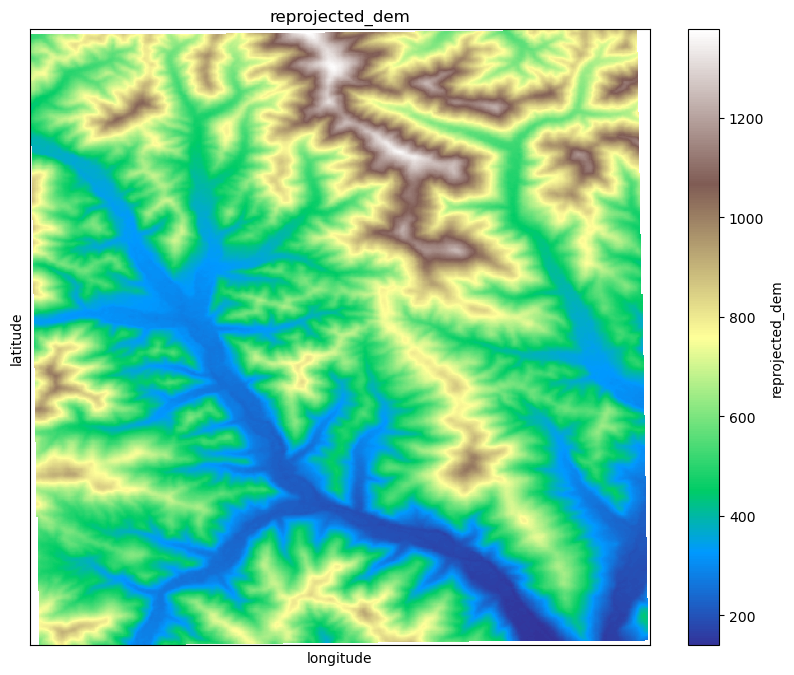

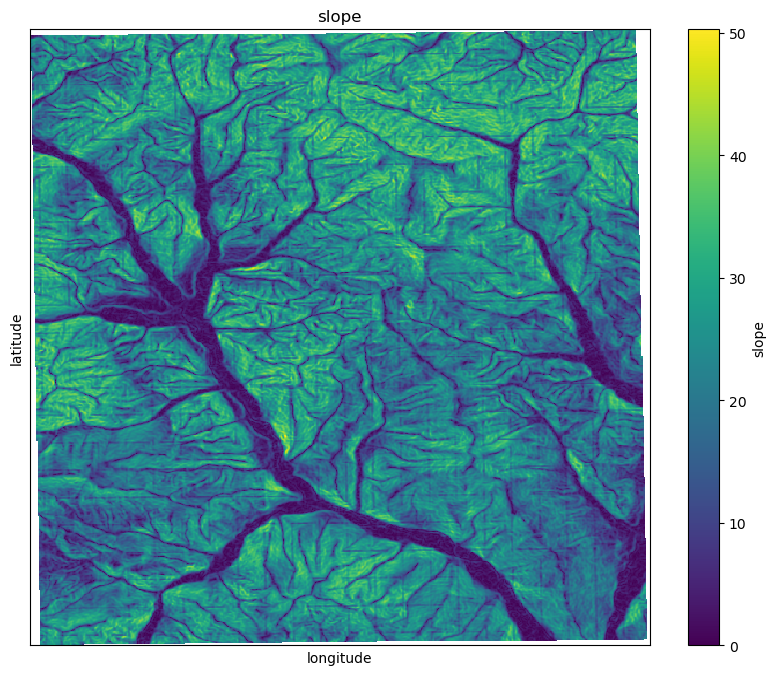

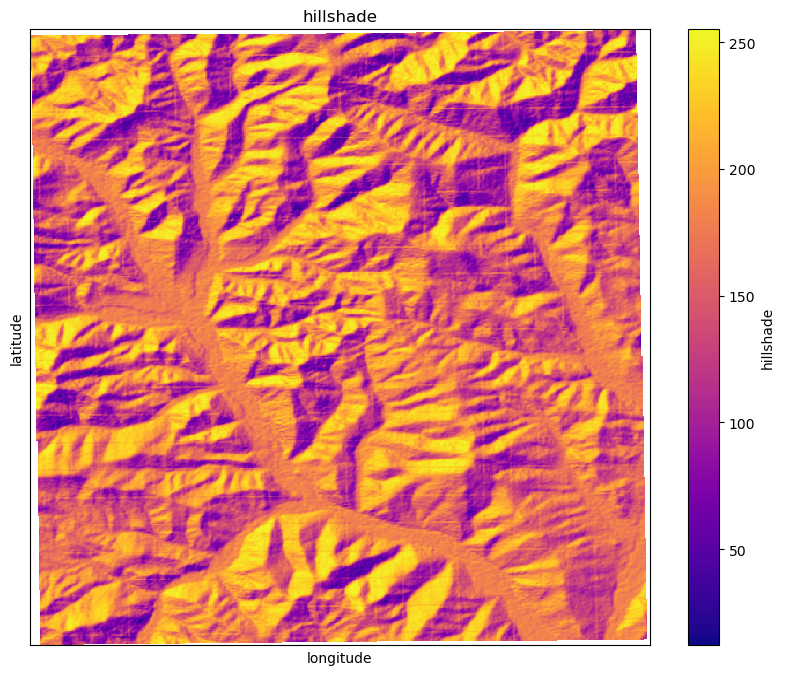

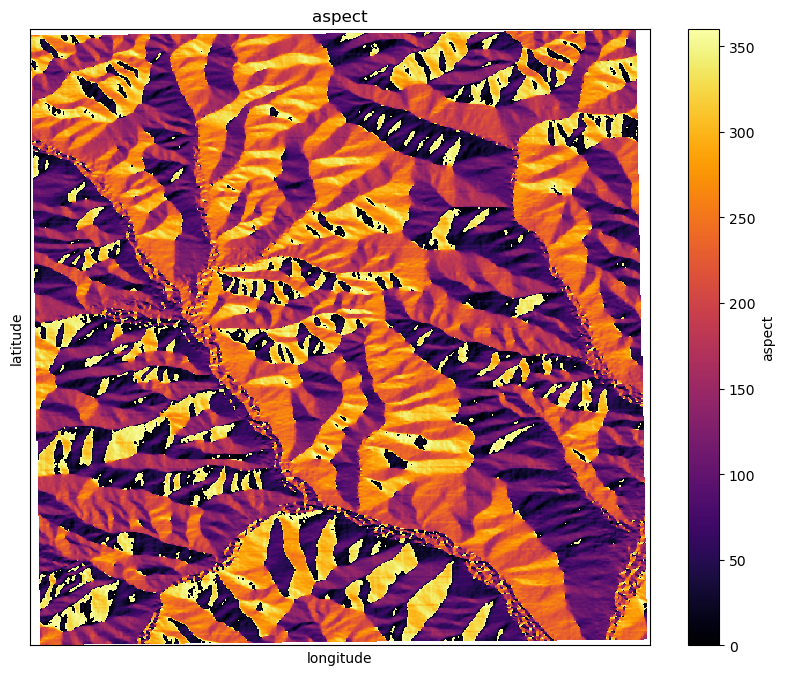

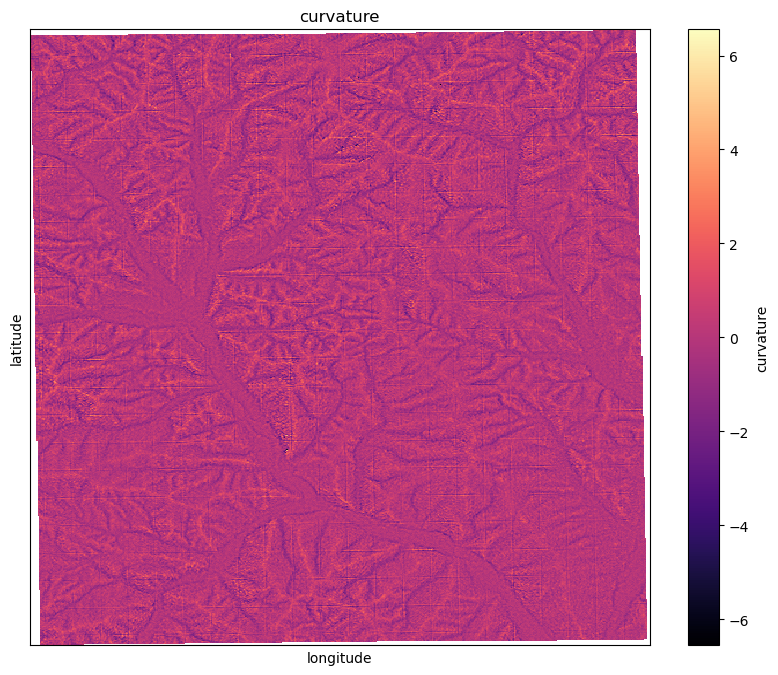

...

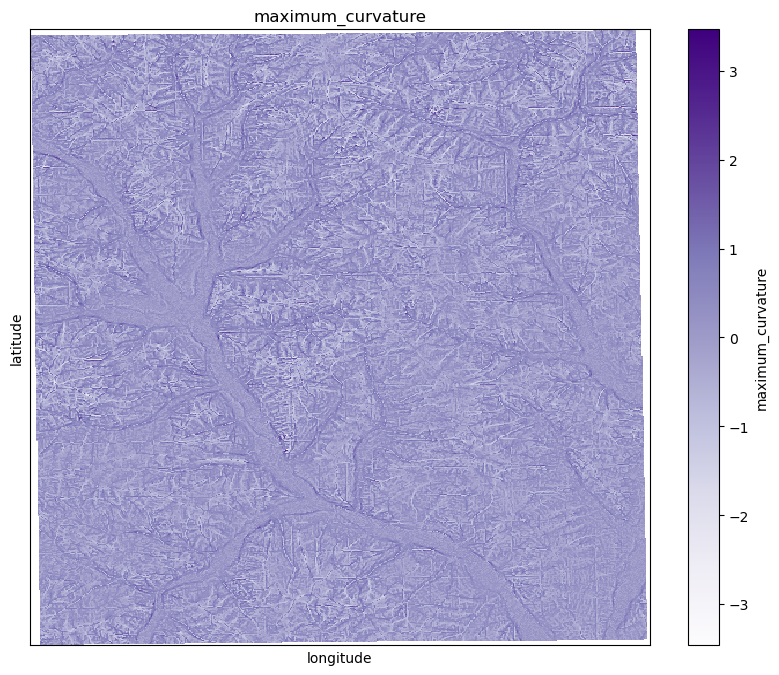

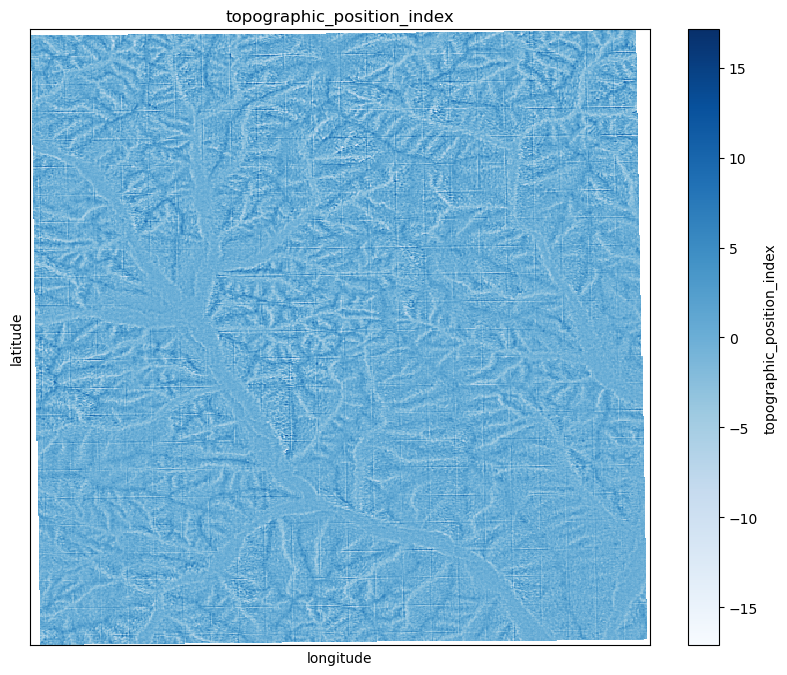

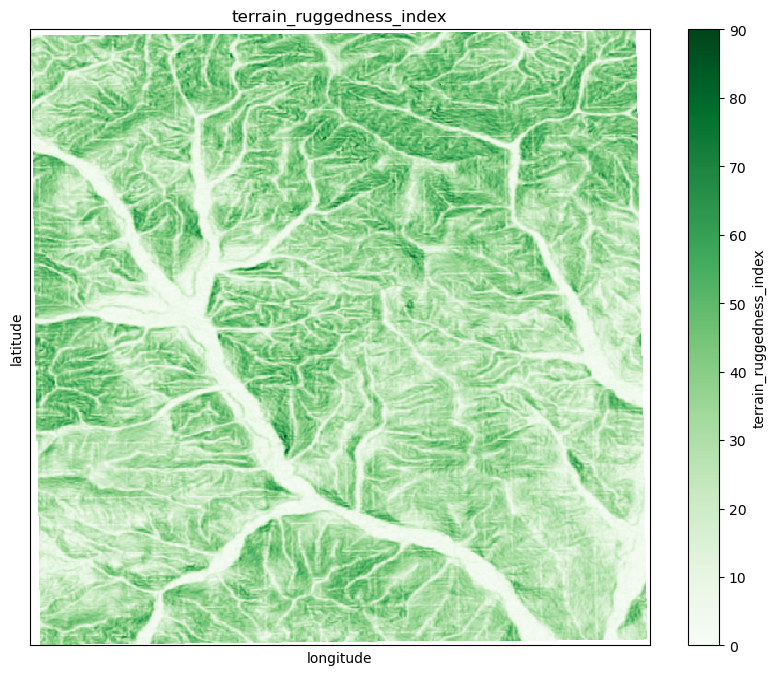

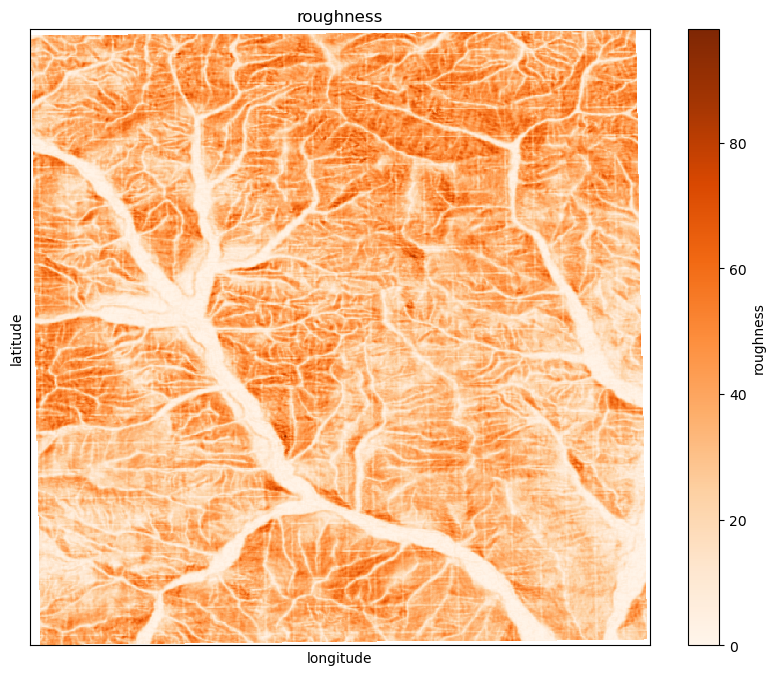

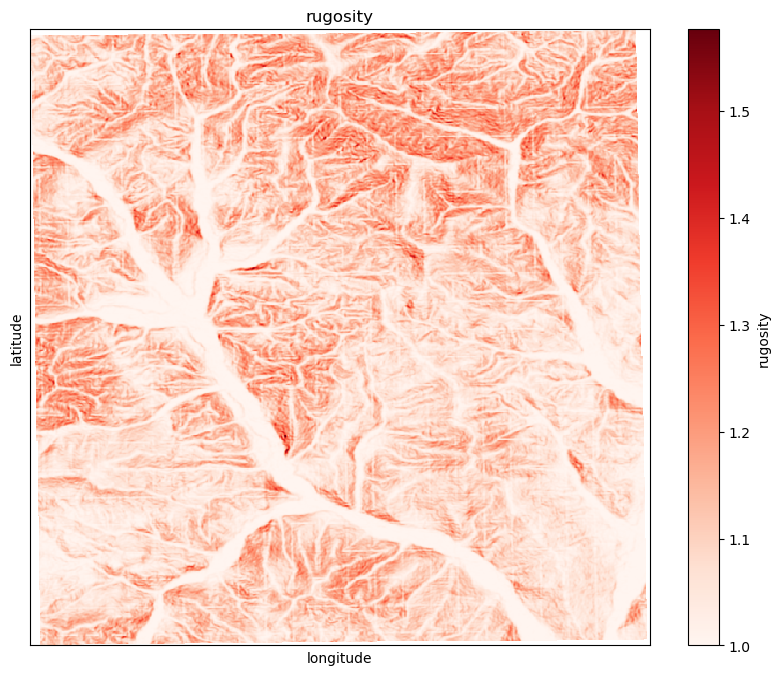

In [6]:
# Вывод каждого канала на отдельном графике
plot_all_bands(terrain_dataset)

In [7]:
for var in terrain_dataset.data_vars:
    da = terrain_dataset[var]
    # Compute min and max values, skipping NaNs
    min_val = da.min(skipna=True).values
    max_val = da.max(skipna=True).values
    print(f"Variable: {var}")
    print("Data type:", da.dtype)
    print(f"  Range: {min_val} to {max_val}\n")


Variable: reprojected_dem
Data type: float16
  Range: 139.0 to 1378.0

Variable: slope
Data type: float16
  Range: 0.0 to 50.28125

Variable: hillshade
Data type: float16
  Range: 12.0546875 to 255.0

Variable: aspect
Data type: float16
  Range: 0.0 to 359.75

Variable: curvature
Data type: float16
  Range: -6.5546875 to 4.66796875

Variable: planform_curvature
Data type: float16
  Range: -3.466796875 to 2.8125

Variable: profile_curvature
Data type: float16
  Range: -2.849609375 to 3.13671875

Variable: maximum_curvature
Data type: float16
  Range: -3.466796875 to 2.994140625

Variable: topographic_position_index
Data type: float16
  Range: -17.125 to 13.125

Variable: terrain_ruggedness_index
Data type: float16
  Range: 0.0 to 90.0

Variable: roughness
Data type: float16
  Range: 0.0 to 98.0

Variable: rugosity
Data type: float16
  Range: 1.0 to 1.576171875



In [8]:
# Выводим общие свойства Dataset
print("Dataset dimensions:", terrain_dataset.dims)
print("Dataset sizes:", terrain_dataset.sizes)
print("Coordinates:\n", terrain_dataset.coords)
print("Attributes:\n", terrain_dataset.attrs)
total_values = sum(da.size for da in terrain_dataset.data_vars.values())
print("Total number of values in the dataset:", total_values)

Dataset dimensions: FrozenMappingWarningOnValuesAccess({'latitude': 748, 'longitude': 536})
Dataset sizes: Frozen({'latitude': 748, 'longitude': 536})
Coordinates:
 Coordinates:
  * longitude    (longitude) float64 4kB 5.708e+05 5.708e+05 ... 5.869e+05
  * latitude     (latitude) float64 6kB 4.995e+06 4.995e+06 ... 4.972e+06
    spatial_ref  int32 4B 0
Attributes:
 {'AREA_OR_POINT': 'Area', 'scale_factor': 1.0, 'add_offset': 0.0, 'resolution_m': 30, 'coordinate_system': <Projected CRS: EPSG:32653>
Name: WGS 84 / UTM zone 53N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 132°E and 138°E, northern hemisphere between equator and 84°N, onshore and offshore. China. Japan. Russian Federation.
- bounds: (132.0, 0.0, 138.0, 84.0)
Coordinate Operation:
- name: UTM zone 53N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich
}
Total number of values in the dataset: 4

**Для одной точки нельзя рассчитать показатели рельефа - можно получить только высоту. Для рассчета показателей рельефа нужны соседние точки. Поэтому при попытке посчитать показатели рельефа выкидывается исключение.**

In [ ]:
# Пример с передачей точки вместо области
import json
lat, lon = 55.600, 37.172

sample_geojson = {
    "type": "FeatureCollection",
    "features": [
        {
            "type": "Feature",
            "geometry": {
                "type": "Point",
                "coordinates": 
                        [lon, lat]
            },
            "properties": {
                # В данном примере отсутствует временной промежуток → None
                "time": None,
                # Поскольку передается точка → None
                "is_rectangle": None
            }
        }
    ]
}

# Сохраним GeoJSON в файл
with open("sample.geojson", "w", encoding="utf-8") as f:
    json.dump(sample_geojson, f, ensure_ascii=False, indent=2)


# Инициализируем GEE
initialize_gee(project='projectomela')

# Определим координаты и названия файлов
geojson_path = "sample.geojson"
dem_file_name = "srtm.tif"
directory = "example_output"

# Загрузим DEM из GEE (DEM сохранится в .tiff файл в директории directory)
dem_xarray = download_dem(geojson_path, dem_file_name, directory)
# Путь к DEM файлу
dem_path = os.path.join(directory, dem_file_name)
print(dem_xarray)
# Определим, какие аттрибуты мы хотим считать
attributes = [
    'slope', 'hillshade', 'aspect', 'curvature', 'planform_curvature', 'profile_curvature',
    'maximum_curvature', 'topographic_position_index', 'terrain_ruggedness_index',
    'roughness', 'rugosity'
]

# Получаем объект xarray.Dataset
terrain_dataset = calculate_terrain_attributes(dem_path, attributes)
terrain_dataset

Google Earth Engine успешно инициализирован.
DEM value at point (37.172, 55.6): 187
Point DEM saved as TIFF at: example_output\srtm.tif
<xarray.DataArray (band: 1, y: 1, x: 1)> Size: 4B
[1 values with dtype=float32]
Coordinates:
  * band         (band) int32 4B 1
  * x            (x) float64 8B 37.17
  * y            (y) float64 8B 55.6
    spatial_ref  int32 4B 0
Attributes:
    AREA_OR_POINT:  Area
    scale_factor:   1.0
    add_offset:     0.0
Shape of DEM (1, 1)
not_loaded
Coordinate system before reprojection None


ValueError: ЦМР это точка. Нельзя посчитать показатели рельефа (для них нужны сосдение пиксели).